In [5]:
import re
import warnings
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.preprocessing import LabelEncoder

warnings.filterwarnings('ignore')

In [6]:
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()
stopwords = stopwords.words('english')

In [7]:
df = pd.read_csv(r'../data/UpdatedResumeDataSet.csv')
df.head(2)

,Category,Resume
0,Data Science,Skills * Programming Languages: Python (pandas...
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...


In [8]:
# Resume text Cleaning
def clean_text(text):
    email_pattern = re.compile(r'[a-zA-Z0-9._%+-]+@[a-zA-Z0-9.-]+\.[a-zA-Z]{2,}')
    links_pattern = re.compile(r'https?:\/\/\S+|www\.\S+')

    cleaned_text = email_pattern.sub('',text)
    cleaned_text = links_pattern.sub('',cleaned_text)

    cleaned_text = re.sub('[^\w\s]','',cleaned_text)
    cleaned_text = re.sub(r'[â]', '', cleaned_text) 
    cleaned_text = re.sub(r'[ã]', '', cleaned_text) 
    cleaned_text = re.sub(r'\b[1-9][0-9]?\b', '', cleaned_text)
    
    cleaned_text = cleaned_text.lower()

    cleaned_text = " ".join([word for word in cleaned_text.split() if word not in stopwords])

    return cleaned_text

df['Resume'] = df['Resume'].apply(clean_text)
df['Resume'].head()

0    skills programming languages python pandas num...
1    education details may 2013 may 2017 uitrgpv da...
2    areas interest deep learning control system de...
3    skills r python sap hana tableau sap hana sql ...
4    education details mca ymcaust faridabad haryan...
Name: Resume, dtype: object

In [9]:
le = LabelEncoder()
df['Category_Label'] = le.fit_transform(df[['Category']])
df.head()

,Category,Resume,Category_Label
0,Data Science,skills programming languages python pandas num...,6
1,Data Science,education details may 2013 may 2017 uitrgpv da...,6
2,Data Science,areas interest deep learning control system de...,6
3,Data Science,skills r python sap hana tableau sap hana sql ...,6
4,Data Science,education details mca ymcaust faridabad haryan...,6


In [10]:
from collections import Counter

count = 0
category_word_freq = {}

for category, group in df.groupby('Category'):
    words = [w for words in group['Resume'] for w in words.split()]
    most_common_words = Counter(words).most_common(20)
    category_word_freq[category] = most_common_words

for category, words in category_word_freq.items():
    print(f"Top words for {category}")
    for word,count in words:
        print(f"{word}: {count}")
    
    print()
    print("----------------------------------------------------------------------------------------")


Top words for Advocate
details: 60
legal: 50
law: 46
university: 38
advocate: 34
exprience: 32
january: 32
company: 30
court: 28
maharashtra: 24
description: 22
skill: 20
less: 20
year: 20
months: 20
district: 16
mumbai: 16
pune: 16
llb: 14
college: 14

----------------------------------------------------------------------------------------
Top words for Arts
ã: 300
company: 156
arts: 144
details: 108
description: 108
january: 96
maharashtra: 90
india: 78
college: 72
skill: 60
british: 60
music: 60
days: 54
development: 54
events: 54
council: 54
responsibilities: 54
projects: 54
mumbai: 48
pune: 42

----------------------------------------------------------------------------------------
Top words for Automation Testing
test: 392
testing: 342
automation: 272
company: 116
description: 108
qtp: 104
project: 100
exprience: 100
months: 94
using: 86
details: 84
good: 84
system: 84
team: 80
integration: 80
involved: 78
software: 76
cases: 76
selenium: 72
environment: 72

---------------------

Top words for Advocate
['details', 'legal', 'law', 'university', 'advocate', 'exprience', 'january', 'company', 'court', 'maharashtra', 'description', 'skill', 'less', 'year', 'months', 'district', 'mumbai', 'pune', 'llb', 'college']
[60, 50, 46, 38, 34, 32, 32, 30, 28, 24, 22, 20, 20, 20, 20, 16, 16, 16, 14, 14]


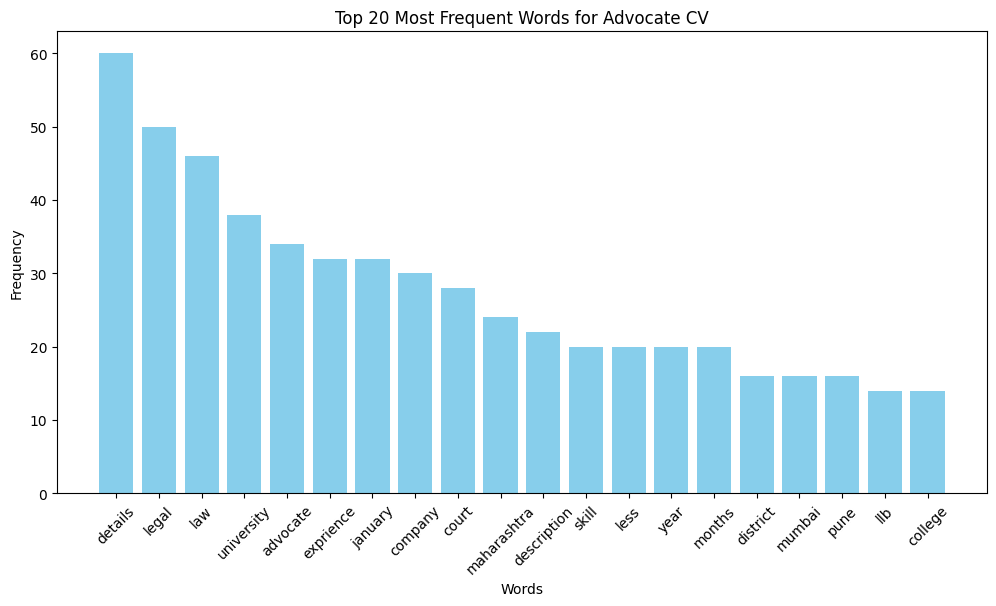

Top words for Arts
['ã', 'company', 'arts', 'details', 'description', 'january', 'maharashtra', 'india', 'college', 'skill', 'british', 'music', 'days', 'development', 'events', 'council', 'responsibilities', 'projects', 'mumbai', 'pune']
[300, 156, 144, 108, 108, 96, 90, 78, 72, 60, 60, 60, 54, 54, 54, 54, 54, 54, 48, 42]


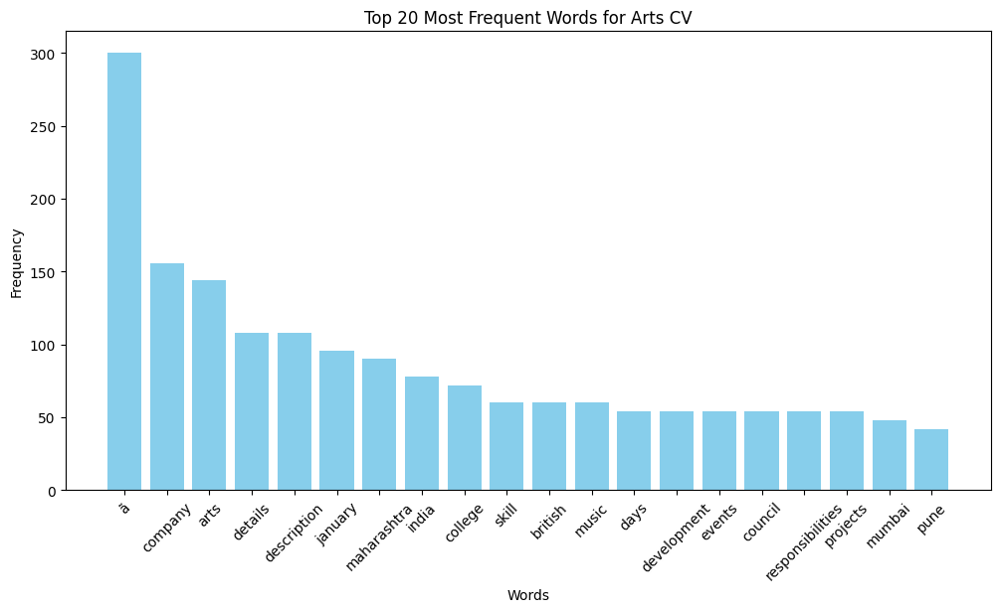

Top words for Automation Testing
['test', 'testing', 'automation', 'company', 'description', 'qtp', 'project', 'exprience', 'months', 'using', 'details', 'good', 'system', 'team', 'integration', 'involved', 'software', 'cases', 'selenium', 'environment']
[392, 342, 272, 116, 108, 104, 100, 100, 94, 86, 84, 84, 84, 80, 80, 78, 76, 76, 72, 72]


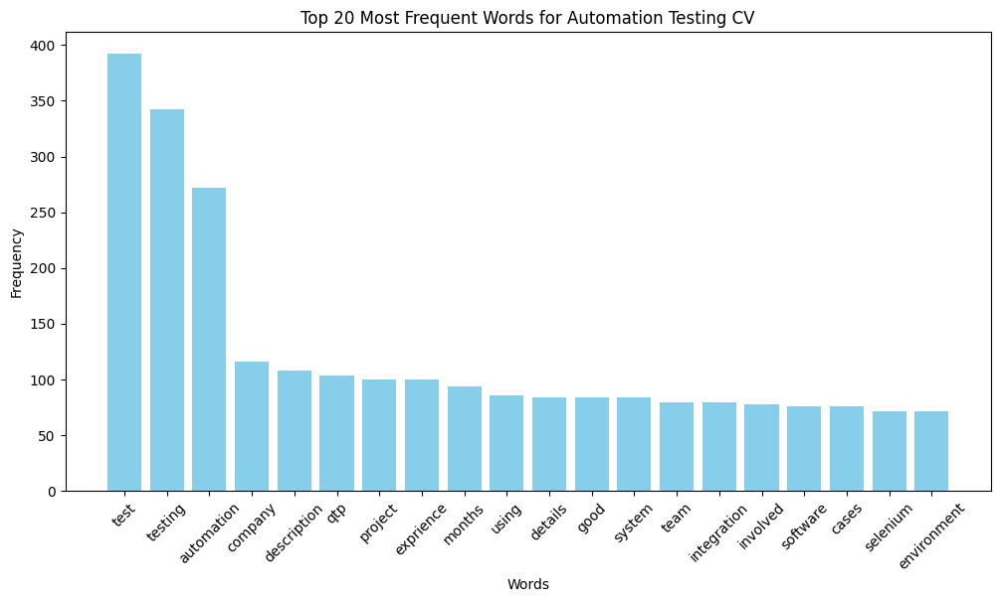

Top words for Blockchain
['company', 'blockchain', 'description', 'exprience', 'months', 'details', 'system', 'ethereum', 'january', 'technology', 'smart', 'computer', 'maharashtra', 'mysql', 'java', '2014', '2017', 'engineering', 'developer', 'worked']
[256, 224, 208, 192, 160, 120, 120, 120, 112, 112, 80, 80, 72, 64, 64, 56, 56, 56, 56, 56]


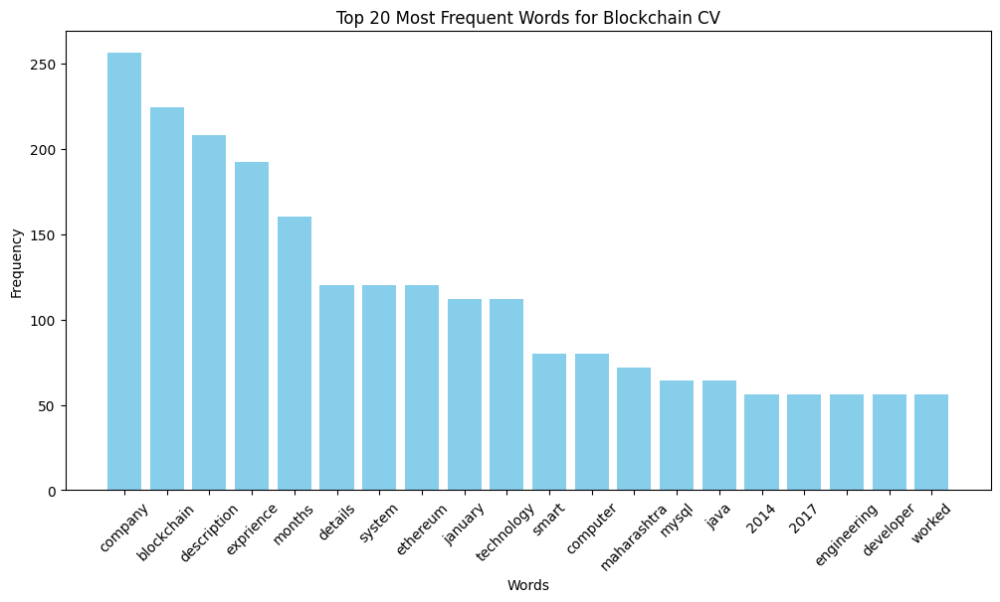

Top words for Business Analyst
['business', 'test', 'company', 'description', 'testing', 'management', 'project', 'details', 'requirement', 'requirements', 'team', 'exprience', 'process', 'functional', 'months', 'system', 'analysis', 'responsibilities', 'analyst', 'user']
[252, 208, 168, 168, 128, 128, 124, 122, 116, 116, 114, 112, 102, 94, 92, 90, 90, 84, 82, 82]


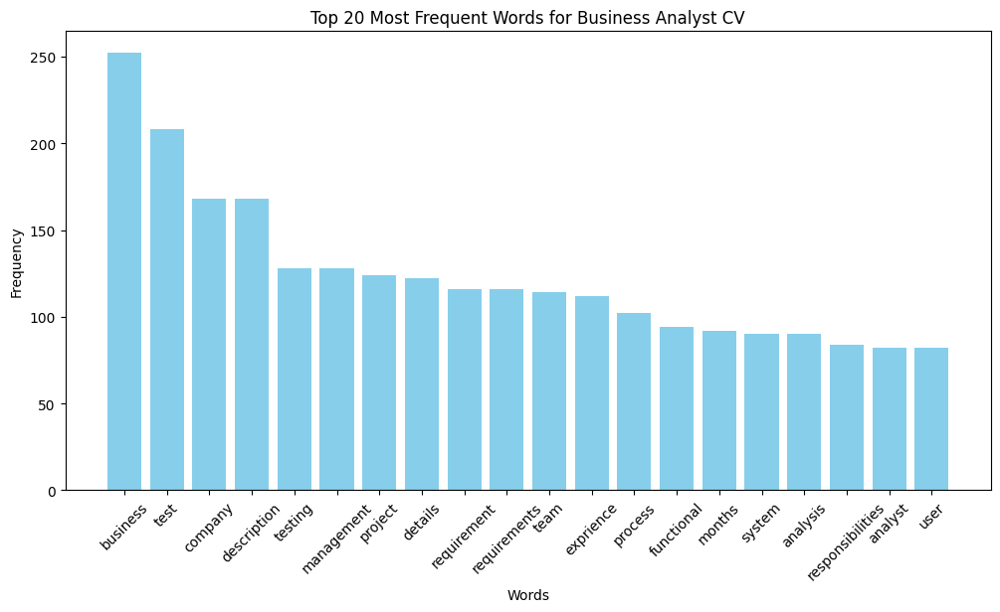

Top words for Civil Engineer
['project', 'civil', 'engineer', 'site', 'company', 'description', 'construction', 'details', 'india', 'inspection', 'work', 'qaqc', 'exprience', 'engineering', 'mumbai', 'client', 'drawings', 'maharashtra', 'quality', 'months']
[224, 160, 140, 132, 128, 116, 76, 72, 60, 56, 56, 48, 48, 44, 44, 40, 40, 40, 36, 36]


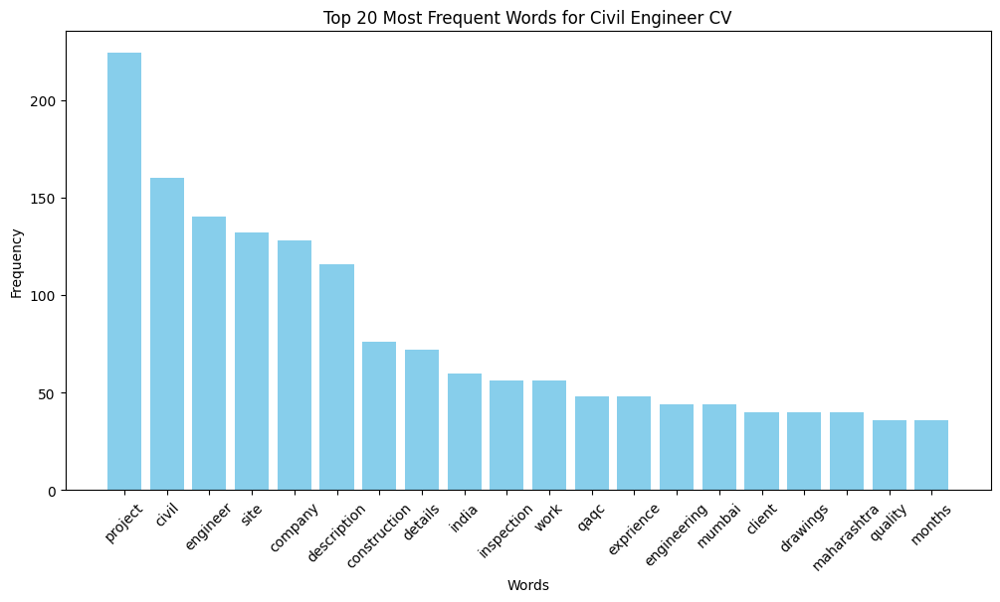

Top words for Data Science
['data', 'exprience', 'months', 'learning', 'python', 'science', 'year', 'less', 'machine', 'details', 'analytics', 'ª', 'using', 'like', 'analysis', 'company', 'deep', 'description', 'business', 'project']
[392, 248, 240, 200, 168, 168, 168, 156, 148, 120, 120, 108, 96, 88, 84, 76, 72, 72, 72, 72]


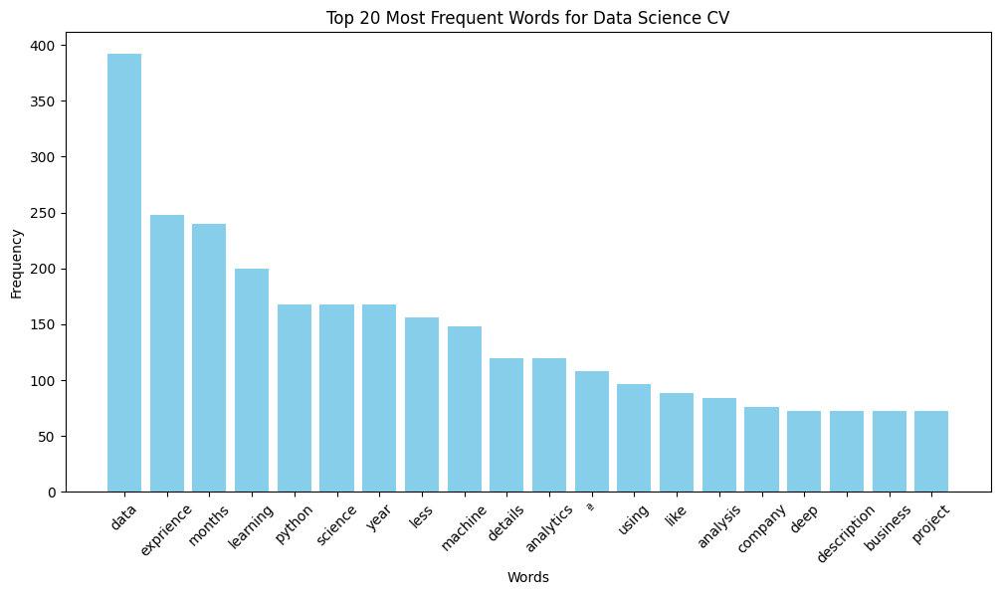

Top words for Database
['â', 'database', 'sql', 'server', 'oracle', 'exprience', 'databases', 'description', 'using', 'company', 'ï', 'details', 'months', 'backup', 'installation', 'servers', 'issues', 'management', 'data', 'ââ']
[540, 465, 216, 210, 195, 138, 120, 117, 114, 111, 111, 105, 105, 102, 99, 99, 96, 90, 90, 90]


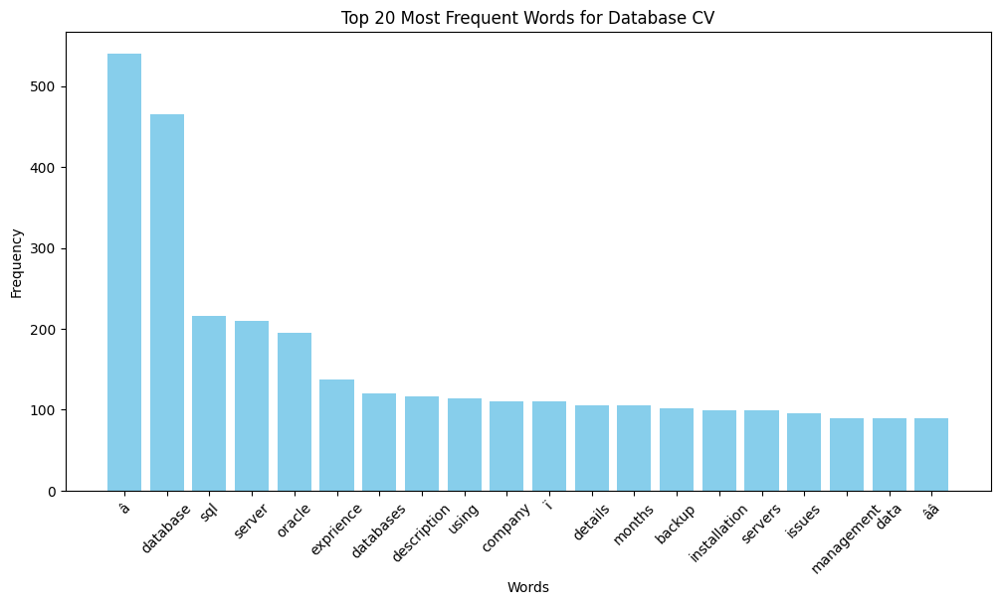

Top words for DevOps Engineer
['exprience', 'project', 'months', 'shell', 'devops', 'team', 'company', 'description', 'servers', 'build', 'mysql', 'automation', 'applications', 'scripts', 'details', 'less', 'year', 'users', 'software', 'cloud']
[424, 419, 386, 255, 226, 215, 213, 210, 205, 204, 191, 180, 173, 171, 165, 153, 153, 153, 149, 142]


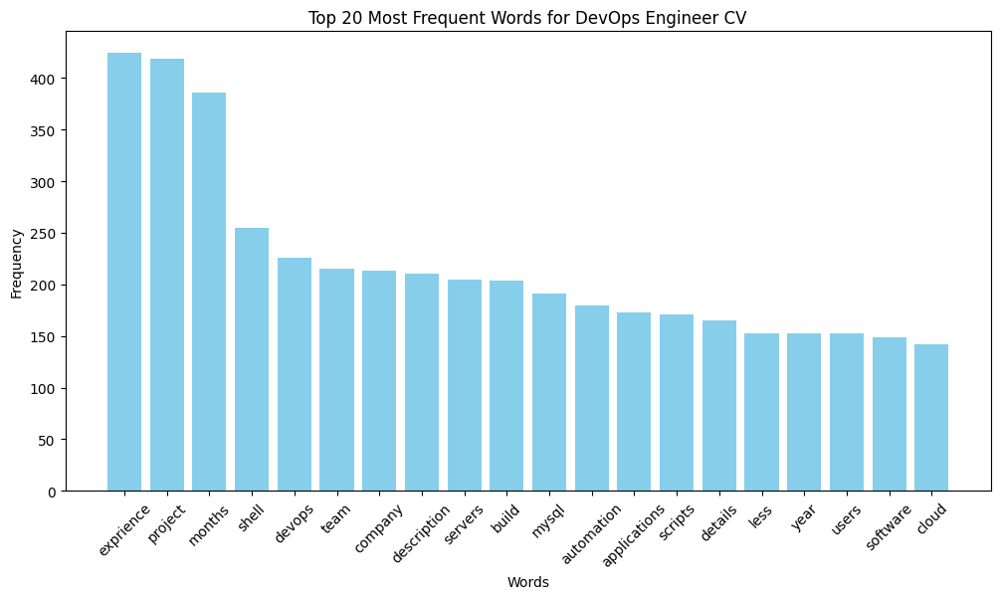

Top words for DotNet Developer
['exprience', 'months', 'project', 'net', 'database', 'sql', 'server', 'details', 'developer', 'description', 'application', 'management', 'aspnet', 'system', 'less', 'year', 'jquery', 'dot', 'role', 'mvc']
[176, 152, 140, 136, 116, 116, 100, 100, 100, 100, 100, 96, 96, 88, 84, 84, 80, 80, 72, 68]


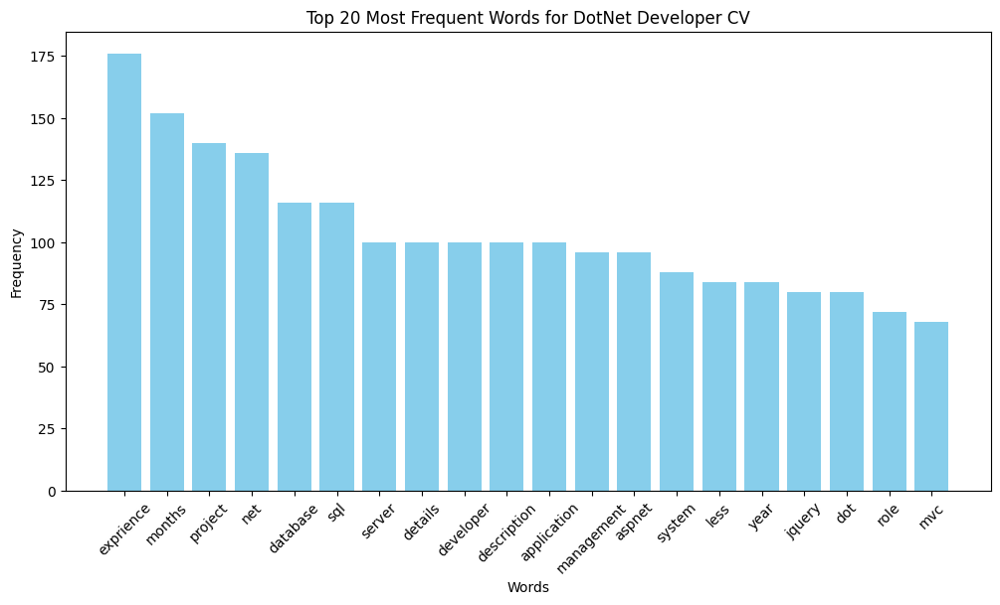

Top words for ETL Developer
['data', 'etl', 'informatica', 'sql', 'exprience', 'project', 'details', 'using', 'talend', 'developer', 'months', 'testing', 'description', 'company', 'unix', 'services', 'mappings', 'server', 'environment', 'business']
[368, 336, 240, 160, 160, 160, 152, 144, 128, 120, 120, 120, 112, 112, 96, 96, 96, 88, 88, 88]


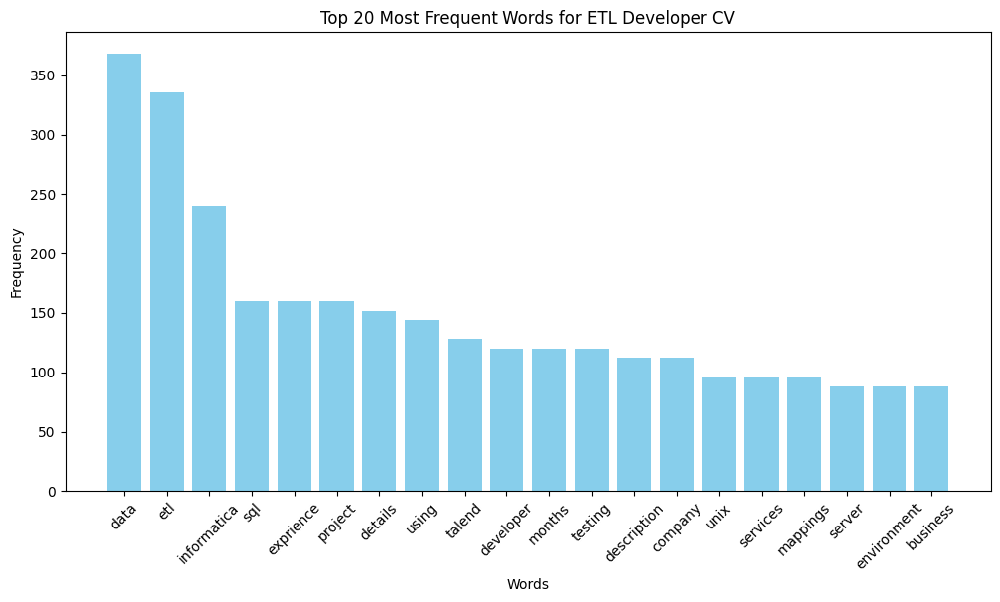

Top words for Electrical Engineering
['electrical', 'maintenance', 'engineering', 'power', 'project', 'details', 'company', 'ltd', 'maharashtra', 'description', 'operation', 'control', 'plant', 'pvt', 'technical', 'layout', 'design', 'equipment', 'cable', 'pune']
[300, 144, 114, 108, 102, 90, 66, 66, 60, 60, 60, 54, 54, 54, 54, 54, 48, 48, 48, 48]


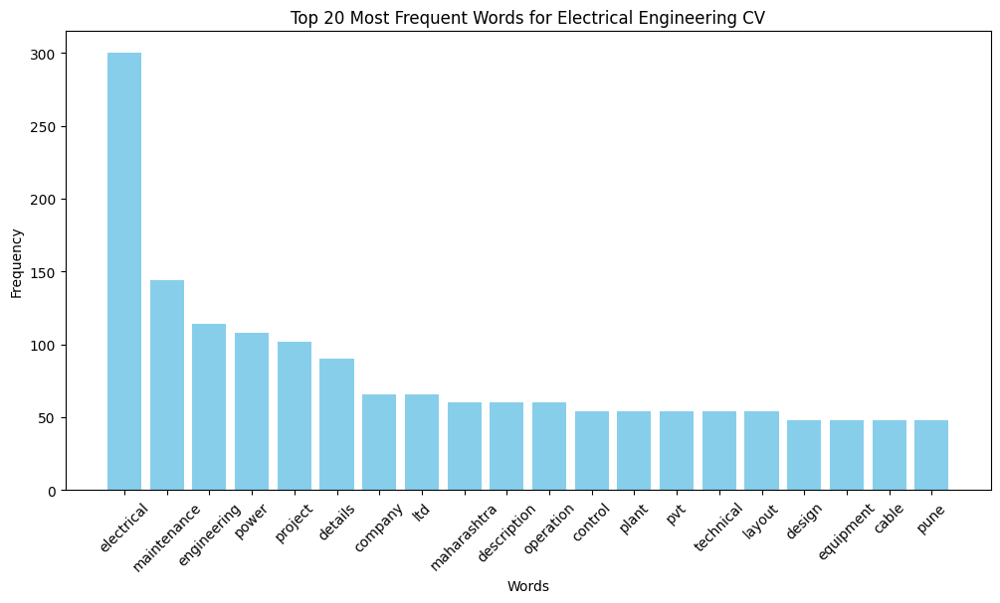

Top words for HR
['details', 'hr', 'exprience', 'company', 'management', 'description', 'skill', 'months', 'education', 'skills', 'monthscompany', 'payroll', 'june', 'january', 'engineering', 'university', 'computer', 'mba', 'college', 'software']
[132, 84, 72, 68, 60, 52, 44, 44, 40, 28, 28, 28, 28, 24, 24, 24, 24, 20, 20, 20]


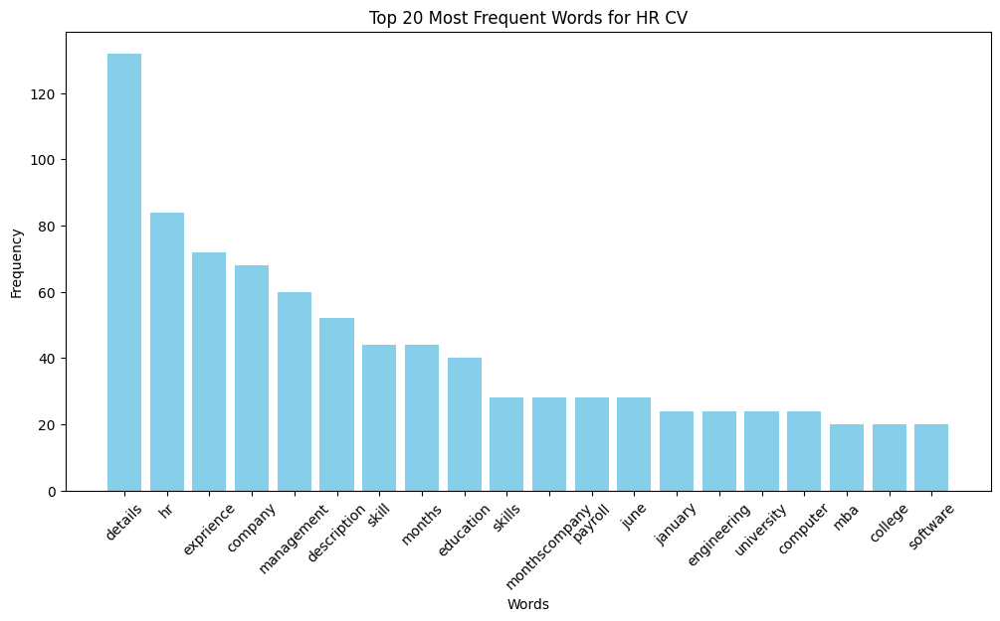

Top words for Hadoop
['data', 'hadoop', 'hive', 'using', 'description', 'sqoop', 'hdfs', 'project', 'exprience', 'details', 'company', 'months', 'cluster', 'developer', 'spark', 'involved', 'mapreduce', 'pig', 'queries', 'system']
[618, 402, 324, 174, 168, 162, 150, 144, 144, 126, 126, 120, 114, 96, 96, 90, 84, 84, 84, 72]


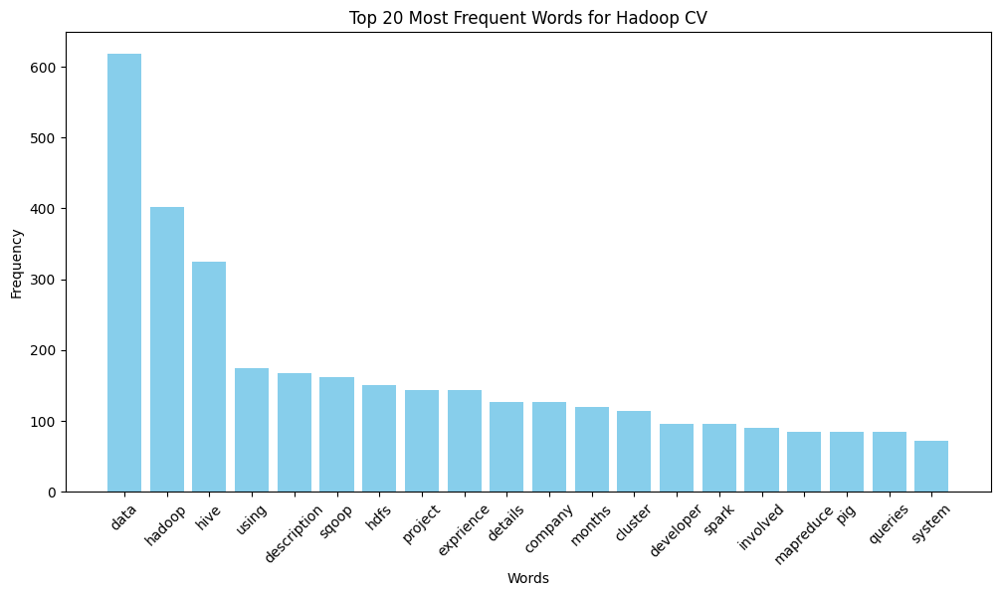

Top words for Health and fitness
['fitness', 'company', 'description', 'details', 'health', 'gym', 'skills', 'nutrition', 'management', 'sales', 'january', 'responsibilities', 'science', 'related', 'college', 'training', 'team', 'handling', 'queries', 'customers']
[180, 140, 115, 90, 80, 70, 60, 60, 55, 55, 50, 50, 45, 45, 40, 40, 40, 35, 35, 35]


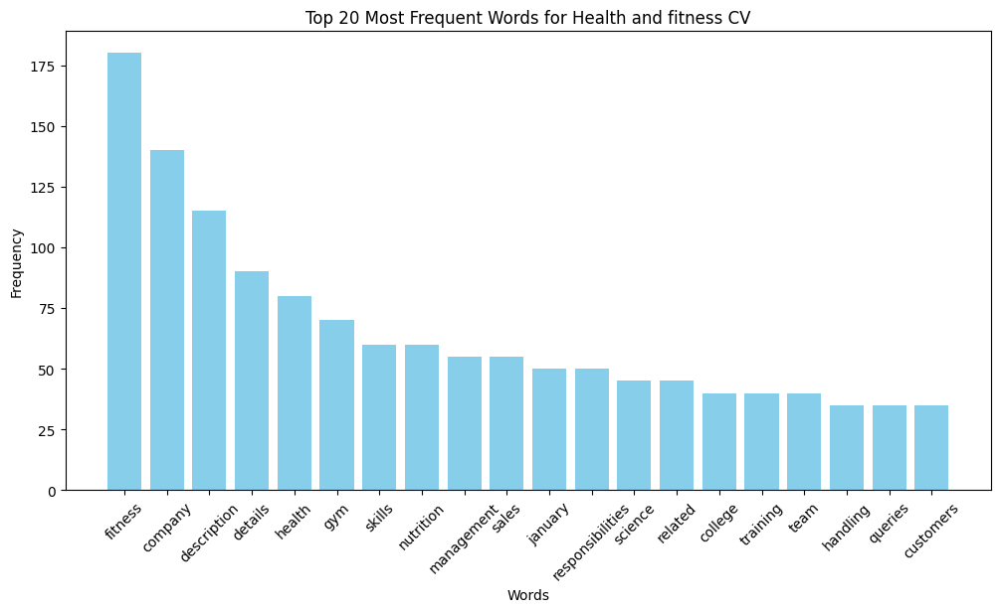

Top words for Java Developer
['java', 'exprience', 'months', 'developer', 'details', 'description', 'company', 'less', 'year', 'maharashtra', 'technologies', 'ajax', 'spring', 'jsp', 'mysql', 'hibernate', 'january', 'project', 'technology', 'javascript']
[606, 408, 372, 288, 276, 198, 192, 186, 186, 168, 132, 132, 126, 126, 114, 108, 108, 102, 96, 96]


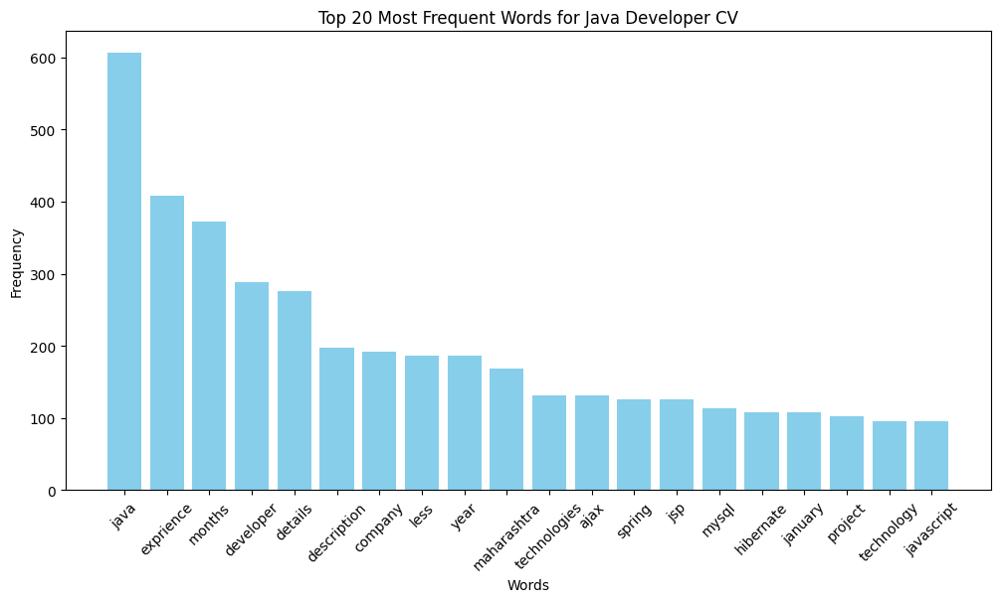

Top words for Mechanical Engineer
['engineering', 'mechanical', 'company', 'design', 'details', 'description', 'technical', 'project', 'products', 'customer', 'vendor', 'ltd', 'cost', 'work', 'training', 'projects', 'role', 'sales', 'vendors', 'development']
[224, 192, 160, 152, 120, 112, 104, 104, 96, 96, 96, 88, 80, 80, 72, 72, 72, 72, 72, 72]


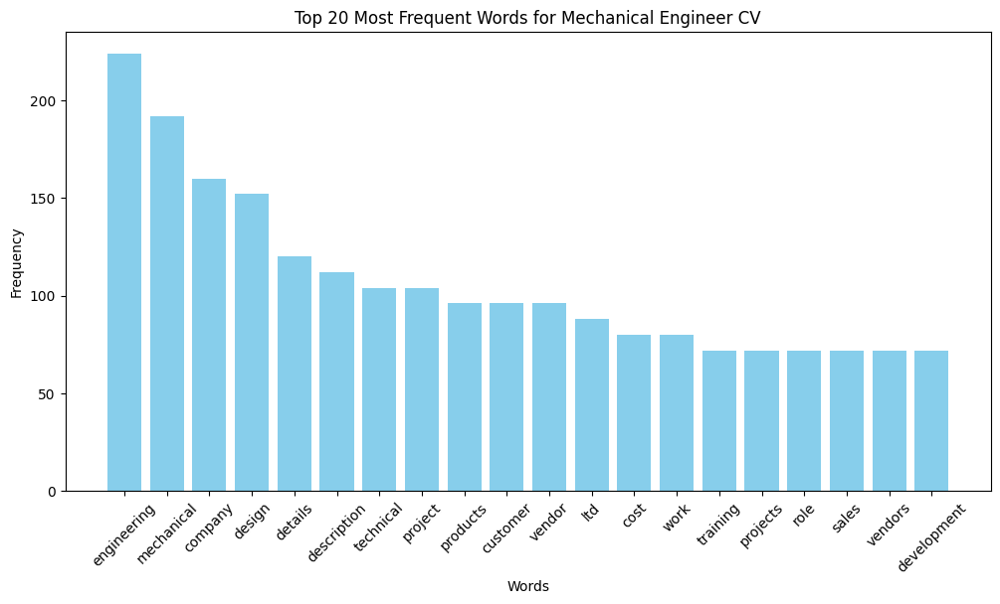

Top words for Network Security Engineer
['network', 'exprience', 'security', 'cisco', 'months', 'configuration', 'year', 'less', 'management', 'firewall', 'etc', 'description', 'server', 'company', 'switches', 'details', 'project', 'servers', 'firewalls', 'devices']
[285, 245, 235, 225, 220, 165, 160, 150, 125, 105, 95, 90, 85, 80, 75, 75, 75, 75, 70, 70]


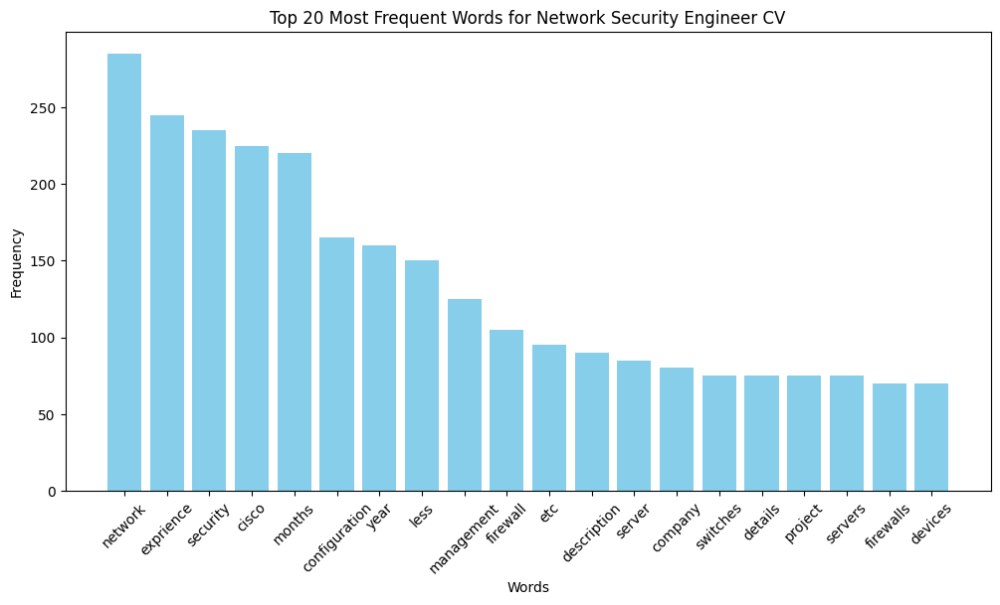

Top words for Operations Manager
['team', 'company', 'operations', 'project', 'services', 'client', 'management', 'ensuring', 'description', 'system', 'customer', 'manager', 'quality', 'development', 'work', 'ltd', 'business', 'india', 'job', 'timely']
[640, 590, 540, 460, 400, 400, 360, 320, 290, 290, 260, 240, 240, 240, 230, 220, 200, 190, 190, 190]


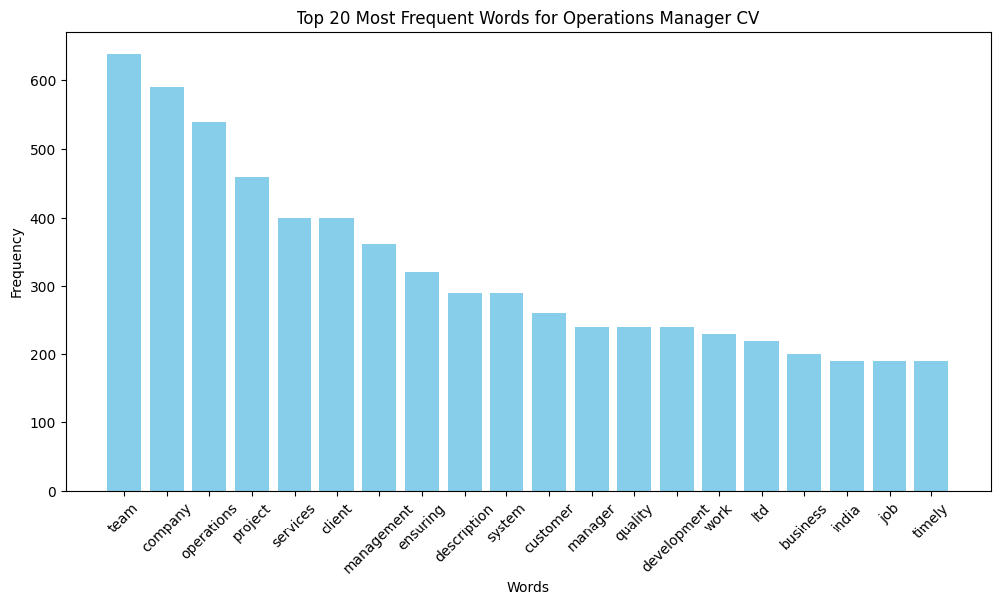

Top words for PMO
['management', 'ãâ', 'project', 'report', 'responsible', 'business', 'reports', 'exprience', 'sla', 'team', 'data', 'skills', 'months', 'company', 'documentation', 'description', 'process', 'resource', 'monitor', 'training']
[430, 400, 370, 210, 160, 150, 140, 140, 140, 130, 120, 110, 110, 110, 100, 100, 100, 100, 100, 100]


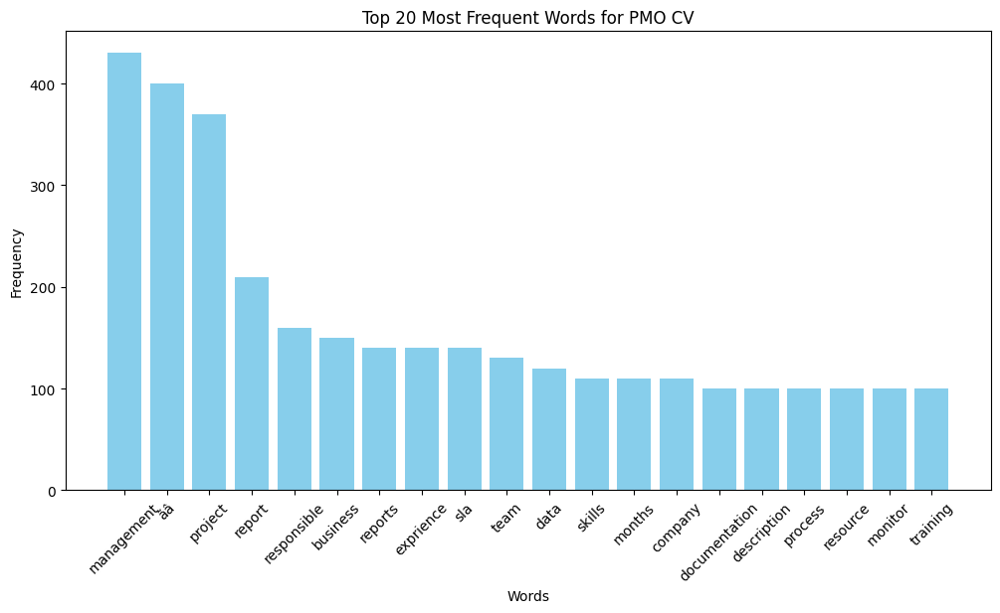

Top words for Python Developer
['python', 'exprience', 'months', 'pune', 'completed', 'details', 'developer', 'training', 'year', 'internal', 'maharashtra', 'less', 'project', 'development', 'web', 'mysql', 'computer', 'company', 'technical', 'django']
[328, 264, 224, 216, 160, 144, 136, 128, 112, 104, 104, 104, 88, 80, 80, 80, 80, 72, 64, 64]


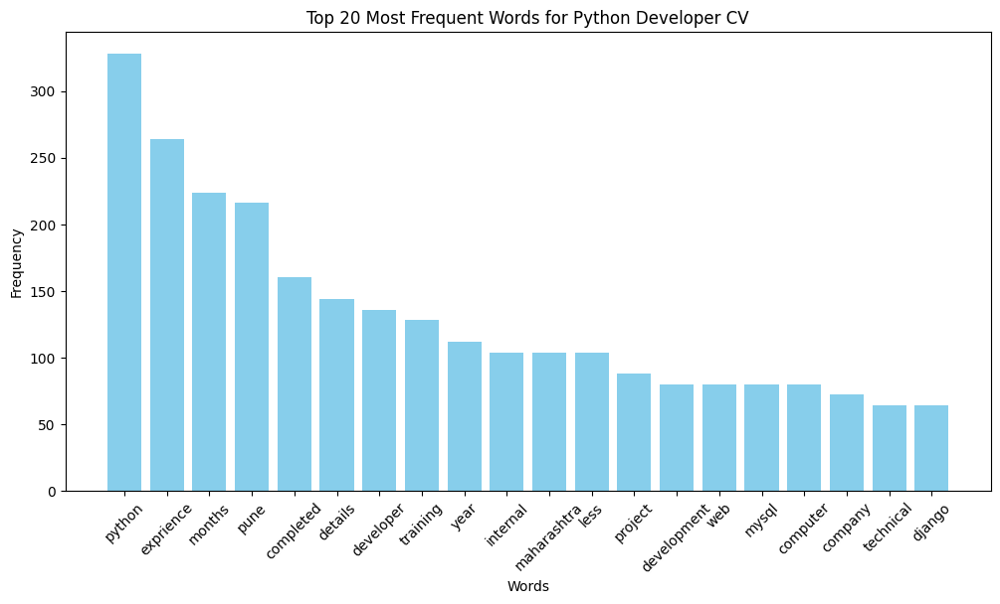

Top words for SAP Developer
['sap', 'bo', 'project', 'hana', 'reports', 'data', 'exprience', 'business', 'company', 'months', 'using', 'developer', 'users', 'details', 'description', 'team', 'application', 'issues', 'webi', 'universe']
[292, 140, 132, 124, 112, 108, 100, 96, 92, 84, 80, 80, 76, 72, 72, 68, 68, 64, 64, 60]


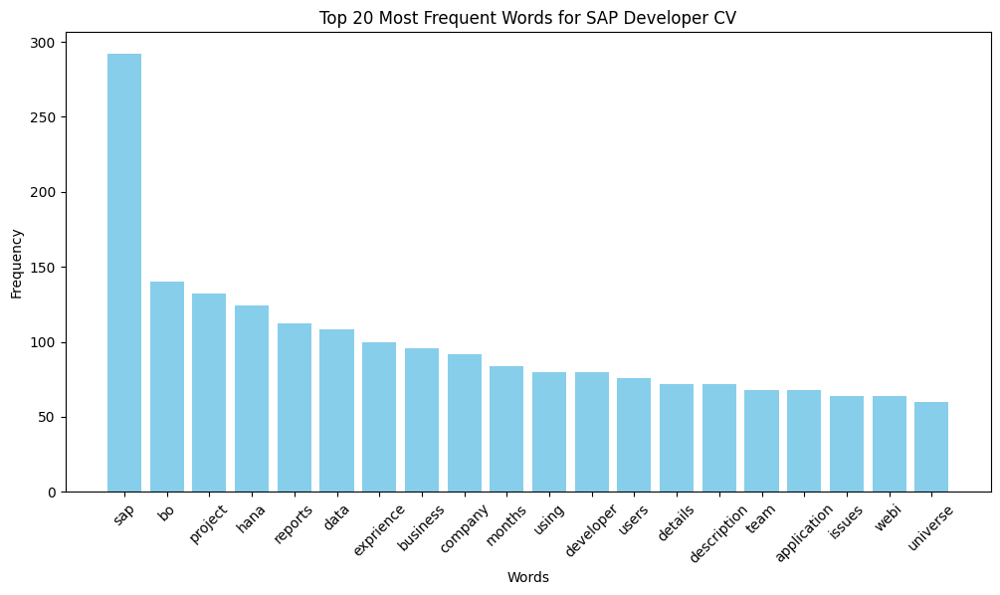

Top words for Sales
['sales', 'exprience', 'months', 'team', 'details', 'manager', 'company', 'description', 'marketing', 'ms', 'year', 'office', 'college', 'targets', 'skill', 'ltd', 'cricket', 'work', 'staff', 'worked']
[400, 168, 128, 128, 120, 112, 112, 96, 96, 72, 64, 64, 64, 64, 56, 56, 56, 56, 56, 48]


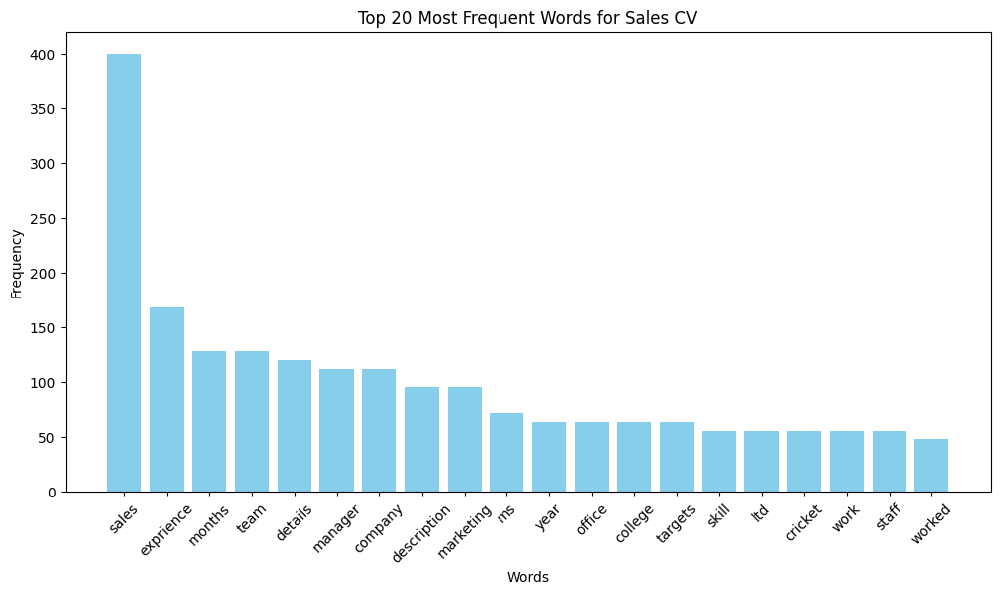

Top words for Testing
['testing', 'test', 'details', 'exprience', 'months', 'maharashtra', 'company', 'check', 'transformer', 'january', 'engineer', 'description', 'system', 'project', 'windows', 'quality', 'skill', 'ltd', 'android', 'engineering']
[370, 320, 260, 230, 220, 170, 140, 140, 140, 130, 130, 130, 130, 130, 130, 120, 90, 90, 90, 90]


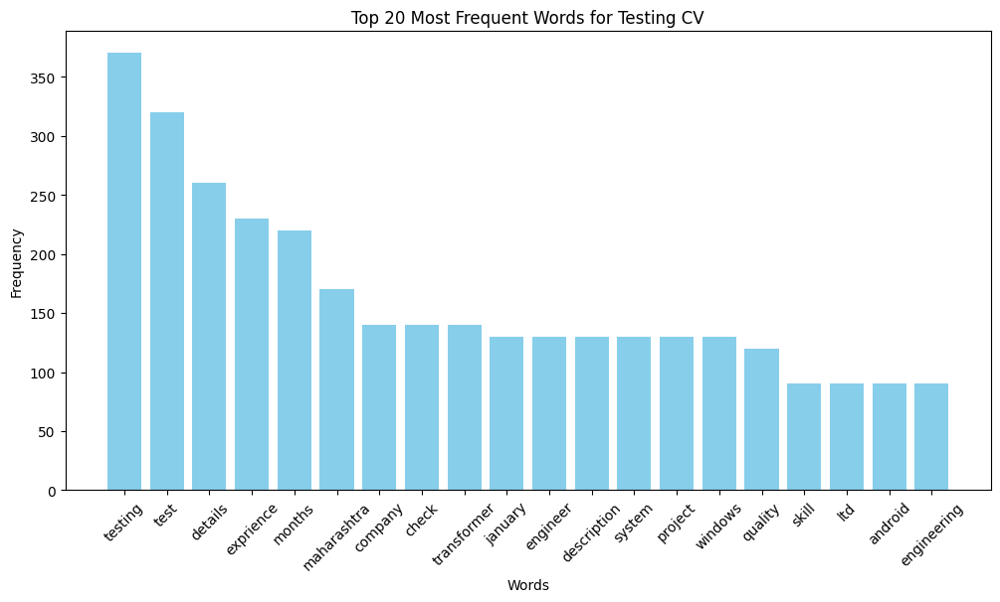

Top words for Web Designing
['project', 'application', 'description', 'web', 'exprience', 'used', 'bootstrap', 'months', 'details', 'software', 'company', 'jquery', 'developed', 'technologies', 'roles', 'responsibility', 'ui', 'designed', 'photoshop', 'maharashtra']
[288, 252, 234, 207, 198, 171, 162, 162, 153, 144, 144, 135, 135, 126, 126, 126, 117, 117, 108, 108]


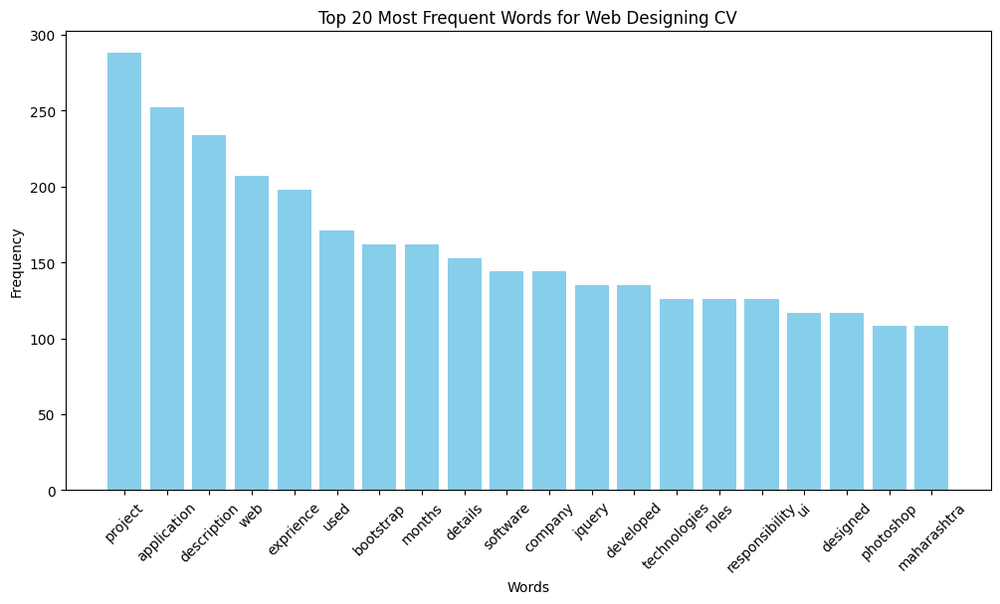

In [11]:
for category, words in category_word_freq.items():
    print(f"Top words for {category}")
    word,count = zip(*words)
    word,count = list(word),list(count)
    print(word)
    print(count)

    plt.figure(figsize=(12, 6))
    plt.bar(word, count, color='skyblue')
    plt.xticks(rotation=45)
    plt.title(f"Top {20} Most Frequent Words for {category} CV")
    plt.xlabel("Words")
    plt.ylabel("Frequency")
    plt.show()


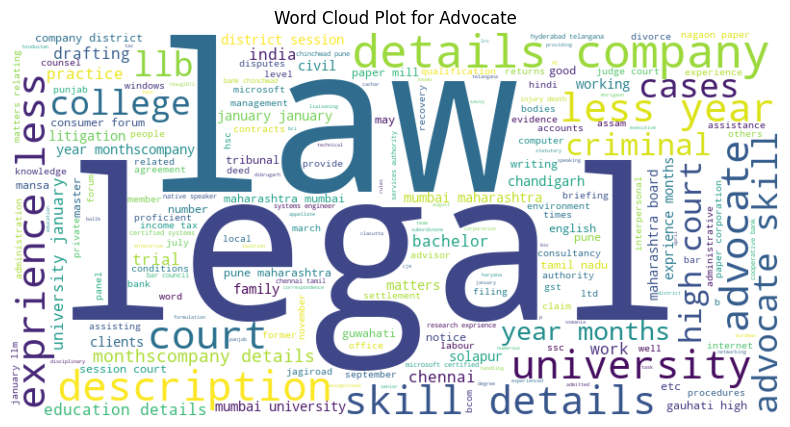

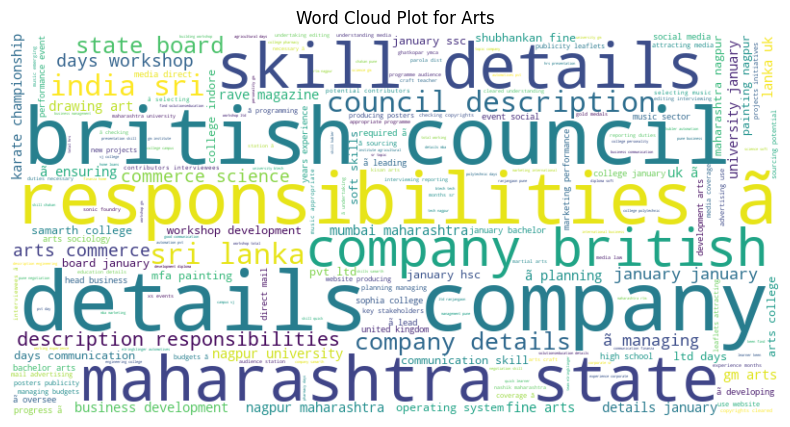

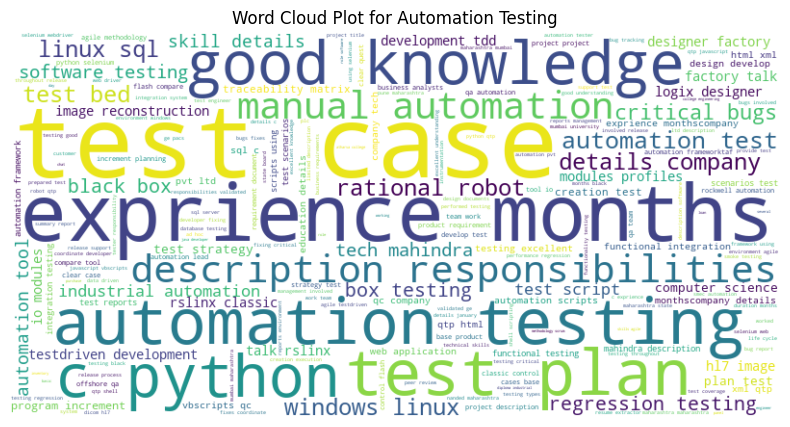

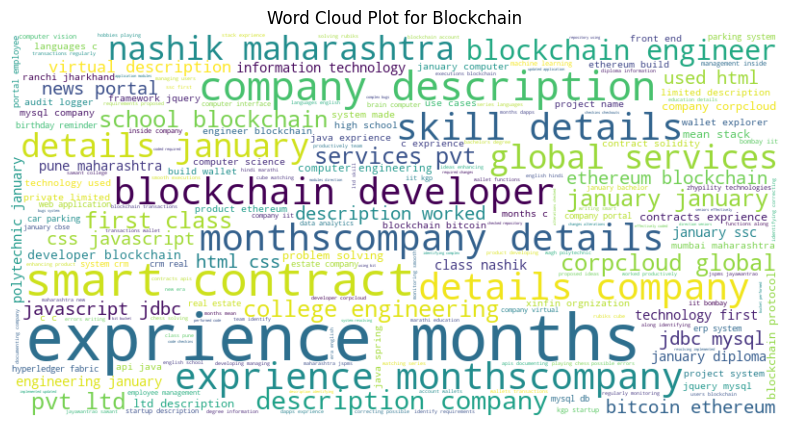

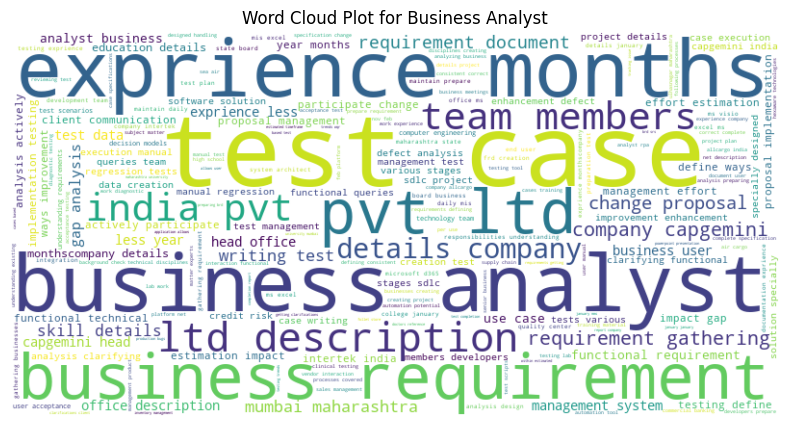

...

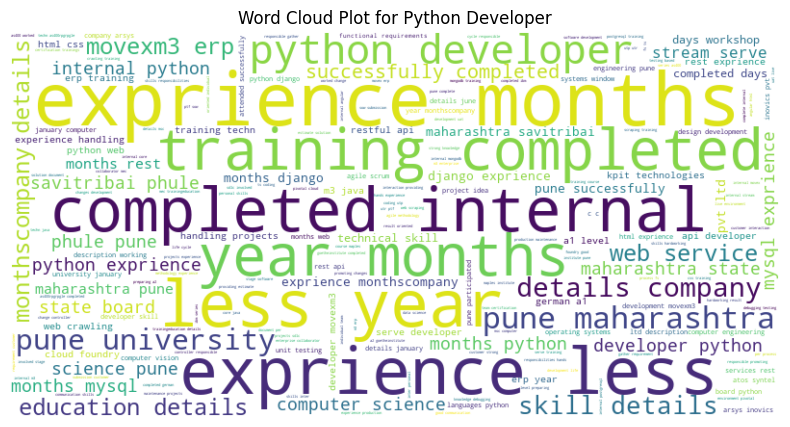

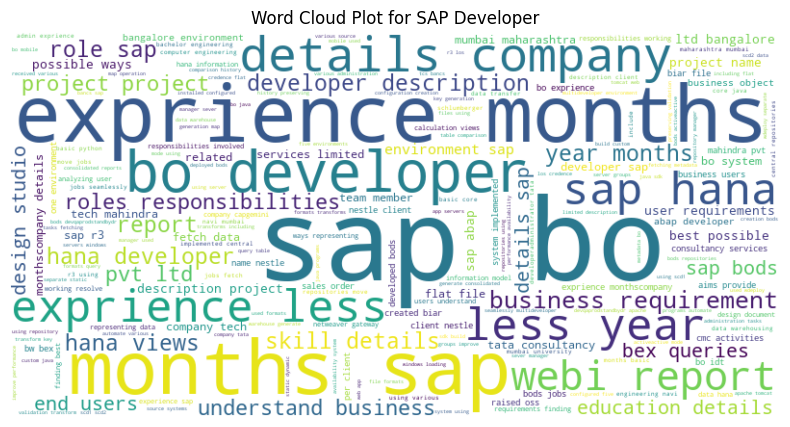

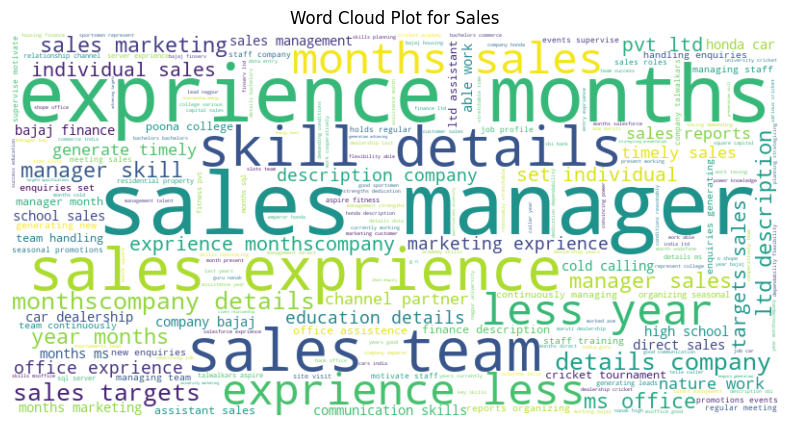

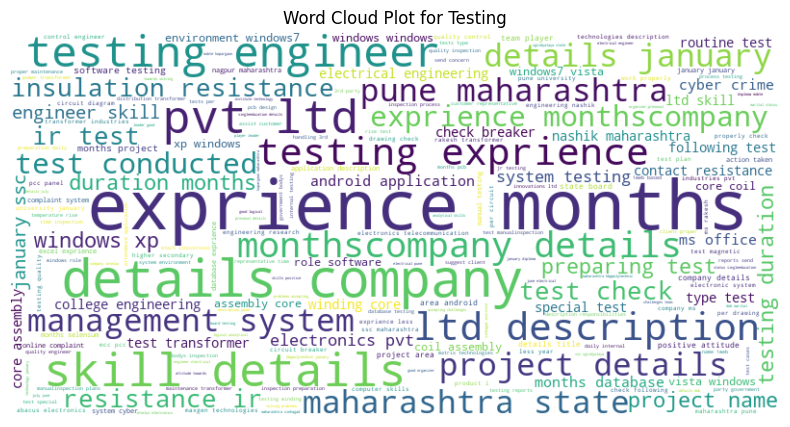

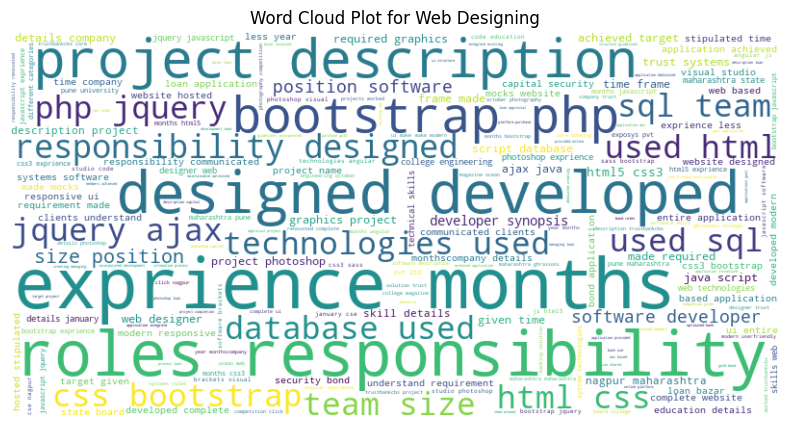

In [12]:
# generating word cloud
from wordcloud import WordCloud

def generate_word_cloud(text_data,Category):
    # Join the words to form a single large text
    text = " ".join(text_data)
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    # Plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud Plot for {Category}')
    plt.show()

for category, group in df.groupby('Category'):
    words = [w for words in group['Resume'] for w in words.split()]
    generate_word_cloud(words,category)

    # most_common_words = Counter(words).most_common(20)
    # category_word_freq[category] = most_common_words


In [14]:
# lets apply word2vec on the cleaned text

import gensim
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize

# Tokenize the cleaned text
df['Tokenized_Resume'] = df['Resume'].apply(lambda x: word_tokenize(x))

# Create a Word2Vec model
model = Word2Vec(sentences=df['Tokenized_Resume'], vector_size=300, window=5, min_count=5, workers=4,epochs=10)

model.save("../models/word2vec_model.model")

# # To check the vector for a word
# word_vector = model.wv['company']  # Replace 'company' with any word in your dataset

# # To find most similar words
# similar_words = model.wv.most_similar('company', topn=5)
# print(similar_words)

df.head(3)

,Category,Resume,Category_Label,Tokenized_Resume
0,Data Science,skills programming languages python pandas num...,6,"[skills, programming, languages, python, panda..."
1,Data Science,education details may 2013 may 2017 uitrgpv da...,6,"[education, details, may, 2013, may, 2017, uit..."
2,Data Science,areas interest deep learning control system de...,6,"[areas, interest, deep, learning, control, sys..."


In [18]:
def get_average_word2vec(tokens,model,vector_size=300):
    word_vectors = [model.wv[word] for word in tokens if word in model.wv]

    if len(word_vectors) == 0:
        return np.zeros(vector_size)
    
    return np.mean(word_vectors,axis=0)

X = df['Tokenized_Resume'].apply(lambda x: get_average_word2vec(x,model))
features_vector_df = pd.DataFrame(X.tolist(),columns=[f'feature_{i}' for i in range(300)])
features_vector_df.head(2)

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_290,feature_291,feature_292,feature_293,feature_294,feature_295,feature_296,feature_297,feature_298,feature_299
0,0.135168,0.261824,-0.140995,0.113932,-0.138323,-0.180718,0.086539,0.168810,-0.013546,0.020054,...,-0.146527,0.136604,-0.041970,0.083179,0.173762,0.076606,-0.016051,-0.072660,0.126430,-0.165190
1,0.070283,0.619795,-0.214548,0.229239,-0.067702,-0.331359,0.016838,0.222593,-0.236426,0.088637,...,-0.110660,0.303173,0.113345,0.291881,0.368764,0.230058,-0.200958,-0.104269,0.299797,-0.335505


In [19]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(features_vector_df,df['Category_Label'],test_size=0.3,random_state=32)

In [20]:
X_train.shape

(673, 300)

### Model Training

In [23]:
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier 
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, roc_auc_score, precision_score, recall_score

models = {
    "SVC": SVC(),
    # "NaiveBayes": MultinomialNB(),
    "XGBoost": XGBClassifier(),
    "Decision_Tree": DecisionTreeClassifier(),
    "AdaBoost": AdaBoostClassifier(),
    'GradientBoosting': GradientBoostingClassifier(),
    "KNN": KNeighborsClassifier(),
    "Random_Forest": RandomForestClassifier(),
    "Logistic_Regression": LogisticRegression()
}

In [24]:
n = len(models)

for key,value in models.items():
    model = value 
    model.fit(X_train,y_train)

    # make predictions 
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Trained Data performance
    model_train_acc = accuracy_score(y_train, y_train_pred)
    model_train_f1 = f1_score(y_train, y_train_pred, average="weighted")  # Specify 'weighted', 'macro', or 'micro'
    model_train_precision = precision_score(y_train, y_train_pred, average="weighted")
    model_train_recall = recall_score(y_train, y_train_pred, average="weighted")


    # Test Data performance 
    model_test_acc = accuracy_score(y_test,y_test_pred)
    model_test_f1 = f1_score(y_test,y_test_pred, average='weighted')
    model_test_precision = precision_score(y_test,y_test_pred, average='weighted')
    model_test_recall = recall_score(y_test,y_test_pred, average='weighted')

    print(f"Model: {key}")

    print("Model Performance for Training set")
    print("- Accuracy: {:.4f}".format(model_train_acc))
    print("- F1-Score: {:.4f}".format(model_train_f1))
    print("- Precision: {:.4f}".format(model_train_precision))
    print("- Recall: {:.4f}".format(model_train_recall))

    print()

    print("Model Performance for Test set")
    print("- Accuracy: {:.4f}".format(model_test_acc))
    print("- F1-Score: {:.4f}".format(model_test_f1))
    print("- Precision: {:.4f}".format(model_test_precision))
    print("- Recall: {:.4f}".format(model_test_recall))

    print("-----------------------------------------------------------------------------------------------------------------")


Model: SVC
Model Performance for Training set
- Accuracy: 0.9227
- F1-Score: 0.9175
- Precision: 0.9295
- Recall: 0.9227

Model Performance for Test set
- Accuracy: 0.8443
- F1-Score: 0.8269
- Precision: 0.8382
- Recall: 0.8443
-----------------------------------------------------------------------------------------------------------------
Model: XGBoost
Model Performance for Training set
- Accuracy: 1.0000
- F1-Score: 1.0000
- Precision: 1.0000
- Recall: 1.0000

Model Performance for Test set
- Accuracy: 0.9827
- F1-Score: 0.9815
- Precision: 0.9849
- Recall: 0.9827
-----------------------------------------------------------------------------------------------------------------
Model: Decision_Tree
Model Performance for Training set
- Accuracy: 1.0000
- F1-Score: 1.0000
- Precision: 1.0000
- Recall: 1.0000

Model Performance for Test set
- Accuracy: 0.9723
- F1-Score: 0.9687
- Precision: 0.9752
- Recall: 0.9723
--------------------------------------------------------------------------

  File "c:\Users\Nitin Flavier\Desktop\Data Nexus\Data Science\ML_BootCamp\ML_Projects\NLP\Resume_Screening\venv\lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
  File "c:\Users\Nitin Flavier\Desktop\Data Nexus\Data Science\ML_BootCamp\ML_Projects\NLP\Resume_Screening\venv\lib\subprocess.py", line 503, in run
    with Popen(*popenargs, **kwargs) as process:
  File "c:\Users\Nitin Flavier\Desktop\Data Nexus\Data Science\ML_BootCamp\ML_Projects\NLP\Resume_Screening\venv\lib\subprocess.py", line 971, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "c:\Users\Nitin Flavier\Desktop\Data Nexus\Data Science\ML_BootCamp\ML_Projects\NLP\Resume_Screening\venv\lib\subprocess.py", line 1456, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,


Model: KNN
Model Performance for Training set
- Accuracy: 0.9584
- F1-Score: 0.9564
- Precision: 0.9605
- Recall: 0.9584

Model Performance for Test set
- Accuracy: 0.8581
- F1-Score: 0.8449
- Precision: 0.8590
- Recall: 0.8581
-----------------------------------------------------------------------------------------------------------------
Model: Random_Forest
Model Performance for Training set
- Accuracy: 1.0000
- F1-Score: 1.0000
- Precision: 1.0000
- Recall: 1.0000

Model Performance for Test set
- Accuracy: 0.9723
- F1-Score: 0.9686
- Precision: 0.9761
- Recall: 0.9723
-----------------------------------------------------------------------------------------------------------------
Model: Logistic_Regression
Model Performance for Training set
- Accuracy: 0.9881
- F1-Score: 0.9881
- Precision: 0.9888
- Recall: 0.9881

Model Performance for Test set
- Accuracy: 0.9308
- F1-Score: 0.9280
- Precision: 0.9446
- Recall: 0.9308
--------------------------------------------------------------

In [25]:
# SVC params

svc_params = {
    'kernel': ['poly', 'rbf', 'sigmoid'],
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01], 
    'degree': [3,4,5]       
}

xgb_params = {
    'max_depth': [7,9,11,13],
    'min_child_weight': [3,5,7,9],
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2]
}

rf_params = {
    'n_estimators': [50,100,200,500],
    'max_depth': [8,10,12],
    'max_features': ['sqrt','log2']
}

grdb_params = {
    'min_samples_leaf': [3,5,7,9],
    'max_depth': [7,9,11,13],
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
}

# models list for hyper-parameter tuning
cv_models = [
    ("SVC",SVC(),svc_params),
    # ("XGBoost",XGBClassifier(use_label_encoder=False),xgb_params),
    ("RandomForest",RandomForestClassifier(),rf_params),
    ("GradientBoost",GradientBoostingClassifier(),grdb_params),
] 

In [ ]:
from sklearn.model_selection import GridSearchCV

tuned_model = {}
model_params = {}

for name, model, params in cv_models:
    gridSearchCV = GridSearchCV(estimator=model,param_grid=params,cv=3,verbose=1,refit=True)
    tuned_model[name] = gridSearchCV

    gridSearchCV.fit(X_train,y_train)
    model_params[name] = gridSearchCV.best_params_ 


Fitting 3 folds for each of 108 candidates, totalling 324 fits
Fitting 3 folds for each of 24 candidates, totalling 72 fits
Fitting 3 folds for each of 144 candidates, totalling 432 fits
